In [1]:
import json
from typing import List

import numpy as np
import pandas as pd
import torch
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search_clip, \
    compute_results_cirr_val_clip
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [2]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [3]:
CLIP_NAME = 'laion/CLIP-ViT-bigG-14-laion2B-39B-b160k'

In [4]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32, projection_dim=1280)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 1280)
      (position_embedding): Embedding(77, 1280)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-31): 32 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (v_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (q_proj): Linear(in_features=1280, out_features=1280, bias=True)
            (out_proj): Linear(in_features=1280, out_features=1280, bias=True)
          )
          (layer_norm1): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1280, out_features=5120, bias=True)
            (fc2): Linear(in_features=5120, out_features=1280, bias=True)
          )
          (layer_norm2): La

In [5]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME,torch_dtype=torch.float32, projection_dim=1280)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder.eval()

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

clip img encoder loaded.

CLIPVisionModelWithProjection(
  (vision_model): CLIPVisionTransformer(
    (embeddings): CLIPVisionEmbeddings(
      (patch_embedding): Conv2d(3, 1664, kernel_size=(14, 14), stride=(14, 14), bias=False)
      (position_embedding): Embedding(257, 1664)
    )
    (pre_layrnorm): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-47): 48 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (v_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (q_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (out_proj): Linear(in_features=1664, out_features=1664, bias=True)
          )
          (layer_norm1): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1664, out_features=81

In [6]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [7]:
clip_tokenizer = tokenize

In [8]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [9]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [10]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search_clip(
        get_combing_function_with_alpha(alpha),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [11]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,7.773260,7.940684,8.299450,8.538627,8.777805,9.184406,9.543172,10.236786,11.002152,11.767520,...,14.900741,16.981584,20.234394,23.750299,27.290121,30.471179,31.451806,30.447263,27.672806,25.759387
0.05,7.892849,8.084191,8.251614,8.682133,9.088735,9.495336,10.021526,10.475963,11.241329,12.030615,...,15.426931,17.627361,21.047597,24.611337,27.840230,30.877781,31.930161,31.260464,28.725186,26.213825
0.10,7.725424,7.916766,8.227697,8.442956,8.945228,9.519254,9.997609,10.691223,11.624014,12.676392,...,15.594356,18.536235,21.334609,24.970102,28.414255,31.188712,32.193255,31.619230,29.299212,26.859602
0.15,7.868931,7.988519,8.275532,8.658215,8.993064,9.519254,9.997609,10.715140,11.528342,12.795982,...,16.072710,18.990672,21.980387,25.544128,28.773022,31.475723,32.288927,31.332219,29.538387,27.290121
0.20,7.988519,8.227697,8.538627,8.658215,8.969146,9.543172,10.308538,10.786893,11.647931,12.891653,...,16.431476,19.325520,22.386989,25.974646,29.131788,31.260464,31.977996,31.021288,29.251376,27.027026
0.25,7.988519,8.323368,8.514710,8.729969,9.112652,9.543172,10.212868,10.786893,11.671849,12.748146,...,16.574982,19.445109,22.937097,26.644343,29.323128,31.212628,31.380051,30.064577,28.629515,27.003109
0.30,8.084191,8.203779,8.371203,8.586463,9.088735,9.471418,10.236786,10.882564,11.695766,12.795982,...,16.861995,20.019135,22.817507,26.596507,29.275292,30.686438,30.614686,29.514471,28.055489,26.716095
0.35,7.677589,8.036355,8.275532,8.514710,8.993064,9.375747,10.069361,10.882564,11.480507,12.819900,...,17.268597,19.995217,23.104520,26.118153,28.820857,29.992825,29.873237,28.892609,27.768478,26.309496
0.40,7.558001,7.749342,8.012437,8.275532,8.658215,9.088735,9.973691,10.762975,11.480507,12.795982,...,17.101172,19.756038,23.271945,25.855058,28.246832,29.203540,29.107869,28.103325,26.716095,25.185362


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,25.687635,26.070318,27.122697,27.959818,28.964362,30.112413,31.332219,32.623774,34.537193,36.713704,...,42.453960,46.496055,50.562066,54.795504,58.359241,59.794307,60.416168,57.952642,54.747671,50.514233
0.05,25.807223,26.429084,27.194452,28.175077,29.370964,30.471179,31.595314,33.508730,35.063383,37.550825,...,43.291080,47.285339,51.399189,56.134897,59.005022,60.607511,60.655344,58.502752,55.536956,51.494861
0.10,26.046401,26.500836,27.290121,28.270748,29.466635,30.638602,31.906241,33.389142,35.493901,38.029179,...,44.463047,48.050705,52.571154,56.948102,59.746474,61.659890,61.277205,59.005022,55.919635,51.925379
0.15,26.237741,26.955274,27.816311,28.629515,29.538387,30.877781,32.025832,33.676153,35.876584,38.698876,...,45.348004,48.624730,53.240854,57.259029,59.937817,61.540300,61.229372,59.411621,55.991387,52.595073
0.20,26.189905,26.979190,27.792394,28.677350,29.968908,31.093040,32.408515,33.939248,36.426693,39.129394,...,46.209040,49.437934,53.910547,57.569957,59.937817,61.253291,60.679263,58.957189,55.895716,52.355897
0.25,26.548672,27.098781,27.911982,28.820857,29.849318,30.973452,32.552022,34.274098,36.761540,39.296818,...,46.496055,50.370723,54.484576,57.450372,59.674716,60.751015,60.129154,58.048314,55.249941,52.212387
0.30,26.333413,27.146617,27.911982,28.820857,29.849318,31.093040,32.552022,34.441522,37.215978,39.823008,...,46.854821,50.681657,54.508489,57.235110,59.507293,60.224825,59.411621,57.091606,54.317147,51.303518
0.35,26.213825,26.763931,27.505383,28.749102,29.849318,30.949533,32.360679,34.298015,37.048554,39.846927,...,46.735230,50.825161,53.958380,56.995934,58.813679,59.650803,58.287489,55.895716,53.360438,50.155467
0.40,25.783306,26.453000,27.433628,28.533843,29.538387,30.925617,32.360679,34.274098,36.928964,40.038270,...,46.543890,50.322890,53.695285,56.110978,58.048314,58.670175,57.426453,55.130351,52.355897,49.366179


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,37.335566,38.220522,39.225066,40.157858,41.234154,42.812723,44.606555,46.232960,48.505142,51.542693,...,58.167905,61.659890,65.127957,67.998087,70.772541,71.729249,71.370488,69.720161,65.989000,61.851233
0.05,37.813920,38.746712,39.679503,40.612292,41.975603,43.386748,44.941401,47.022244,49.366179,52.427649,...,59.100693,62.449175,66.204256,69.170058,71.418321,72.016263,72.111934,70.485532,66.730446,62.568766
0.10,38.244438,38.985887,39.775175,40.994978,42.549628,43.817270,45.371920,47.644106,50.227219,53.456110,...,59.985650,63.525474,66.969627,69.887584,71.920592,72.757715,72.398949,70.892131,67.184883,63.692898
0.15,38.387945,39.272901,40.157858,41.616839,42.788807,44.199952,45.826358,48.265964,50.849080,53.886628,...,60.655344,63.884240,67.256635,69.983256,72.207606,73.116481,72.638124,71.203059,67.232722,64.003825
0.20,38.220522,39.225066,40.086102,41.521168,43.099737,44.391295,46.448219,48.768237,51.279598,54.484576,...,60.966277,64.123416,67.400146,70.150679,72.351110,73.116481,72.542453,70.772541,67.089212,63.812482
0.25,37.957427,39.129394,40.229610,41.353744,43.004066,44.582635,46.591726,49.150920,51.375270,54.436737,...,61.588138,64.673525,67.400146,69.887584,72.351110,72.542453,71.896678,70.198518,66.658694,63.094956
0.30,37.813920,38.866299,40.062186,41.425496,42.788807,44.415212,46.615642,49.318346,51.973212,54.819423,...,61.348957,64.769197,67.447978,70.294189,72.088015,72.040182,71.490073,69.409233,66.084671,62.568766
0.35,38.077015,39.129394,40.181774,41.329825,42.836642,44.343460,46.543890,49.414015,52.212387,54.771584,...,61.301124,64.745277,67.830664,69.887584,71.394402,71.633583,70.581198,68.093759,65.319300,62.114328
0.40,37.909591,38.603204,39.775175,40.612292,42.143029,44.080365,46.519971,49.294427,51.829708,54.795504,...,61.301124,64.793110,67.065293,69.504905,70.796460,70.437694,69.696248,67.065293,64.195168,61.253291


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,64.338672,65.725905,67.232722,68.739533,70.389861,72.709876,74.695051,76.704139,78.976321,80.722314,...,84.764409,87.227935,88.878256,89.691460,90.624255,91.078687,90.672088,88.806504,85.768956,81.774694
0.05,65.151876,66.419518,67.878497,69.480985,71.418321,73.570913,75.508249,77.493423,79.861277,81.870365,...,85.577613,87.945467,89.356613,90.432912,91.174358,91.437453,90.911263,89.404446,86.342978,82.372636
0.10,65.701985,67.137051,68.452525,70.198518,72.088015,74.097109,76.273620,78.330541,80.602729,82.587898,...,86.486489,88.591248,89.882803,91.006935,91.724467,91.748387,91.246116,89.715379,86.917007,82.850993
0.15,66.156423,67.567569,69.170058,70.772541,72.996891,75.173402,76.967233,79.024154,81.224585,83.233678,...,87.275773,89.165270,90.385073,91.533124,92.083234,91.963643,91.198277,89.763212,86.917007,82.922745
0.20,66.563022,68.022007,69.911504,71.250898,73.236066,75.532168,77.636927,79.550350,81.918204,83.735949,...,87.849796,89.547956,90.959102,91.820139,92.226738,92.035401,91.270030,89.715379,87.012678,83.066255
0.25,66.682613,68.356854,69.935423,71.609664,73.666584,76.034439,78.043532,79.837358,82.276970,84.429562,...,88.423824,89.739299,90.983021,91.628796,92.250657,92.059314,91.341782,89.595789,86.701745,83.066255
0.30,66.634774,68.356854,70.031095,71.753168,73.738343,76.201868,78.282708,80.363548,82.611817,84.788328,...,88.519496,89.930636,90.959102,91.676635,92.011482,91.844058,91.126525,89.141351,86.629993,82.827073
0.35,66.682613,68.404686,70.102847,71.992344,74.168861,76.130110,78.450131,80.770153,83.018416,84.979671,...,88.399905,89.811051,90.815592,91.604877,91.652715,91.580963,90.743840,88.710833,86.008132,82.372636
0.40,66.419518,67.974168,70.031095,71.992344,73.953599,76.034439,78.378379,81.057161,83.161920,85.242766,...,88.352066,89.906722,90.719926,91.078687,91.413540,91.102606,90.289402,87.993306,85.290599,81.655109


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,21.310692,21.884717,22.817507,23.750299,24.635255,25.591964,26.811767,28.318584,30.375507,32.360679,...,37.263814,40.827554,44.941401,49.318346,53.886628,58.048314,61.205453,63.668978,65.247548,65.845490
0.05,21.382445,22.028223,22.745755,23.798135,24.778761,25.950730,26.955274,28.653431,30.519015,33.126047,...,38.340110,41.521168,45.874193,50.179380,54.508489,58.574504,61.899066,64.195168,66.012913,66.276008
0.10,21.167184,22.099976,23.056684,23.893805,24.874432,26.165989,27.337956,28.629515,30.925617,33.365223,...,38.746712,42.143029,46.472135,50.872999,55.082518,59.459460,62.473094,64.721358,66.323847,66.897869
0.15,21.095432,21.956469,23.176274,23.941641,25.065774,26.165989,27.242288,29.060033,31.164792,34.369767,...,39.775175,43.243244,47.022244,51.829708,55.800050,59.722555,62.855774,65.104043,66.897869,67.519730
0.20,21.238938,22.076058,23.176274,23.893805,24.922268,26.118153,27.457547,29.299212,31.690982,34.776369,...,40.277445,43.889022,47.572351,52.236307,56.397992,60.009569,62.855774,65.462810,66.873956,67.400146
0.25,21.430279,22.219564,23.080602,23.798135,24.802679,26.094237,27.816311,29.681894,32.049748,34.943792,...,40.803635,44.271705,48.361635,52.714664,56.900263,60.440087,63.047117,65.367138,66.682613,67.160964
0.30,21.382445,22.243482,23.056684,23.941641,24.898350,26.429084,28.270748,30.375507,32.815117,35.254723,...,41.401580,44.893566,48.672566,53.145182,57.139438,60.248744,63.166708,65.391058,66.419518,66.682613
0.35,21.454197,22.410907,23.200192,24.276489,25.328869,26.476920,28.462091,30.758193,32.815117,35.493901,...,41.784263,45.348004,49.246591,53.480029,56.852430,60.081321,62.616599,65.056205,66.228175,66.347766
0.40,21.334609,22.243482,23.200192,24.300407,25.472376,26.716095,28.557763,30.973452,33.126047,35.804832,...,42.095193,45.706770,49.796700,53.503948,56.708920,60.129154,62.616599,64.888781,66.012913,65.845490


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.449413,42.119110,43.386748,44.439128,45.778522,47.668022,49.461851,51.327431,54.006219,56.541497,...,62.855774,66.132504,69.122219,72.805548,75.364745,77.756518,80.339634,81.392014,82.276970,82.444394
0.05,41.329825,42.477876,43.649843,44.678307,46.352547,48.002869,49.724945,52.236307,54.651999,57.354701,...,63.477635,66.586941,70.150679,73.307818,75.771344,78.378379,80.578810,81.942117,82.827073,83.018416
0.10,41.521168,42.645299,43.889022,45.013154,46.663478,48.457307,50.131547,52.547240,55.417365,57.928723,...,63.860321,67.543650,70.748627,73.881847,76.369292,78.713226,80.554891,82.253051,83.353263,83.281511
0.15,41.592920,42.740971,43.912938,45.467591,46.663478,48.744321,50.753409,53.336525,55.871803,58.383161,...,64.649606,67.950249,71.346569,74.264532,76.608467,78.761059,80.865824,82.444394,83.161920,83.568525
0.20,41.521168,42.597464,43.578091,45.467591,47.333175,49.150920,51.638365,53.862715,56.613249,58.933270,...,65.127957,68.261182,71.537912,74.431956,76.775891,78.689307,80.889738,82.396555,83.281511,83.520687
0.25,41.377661,42.501795,43.984693,45.993781,47.907200,49.772781,51.877540,54.245394,56.876343,59.363788,...,65.797657,69.050467,71.896678,74.455869,76.895481,78.784978,80.913657,82.540065,83.448935,83.640277
0.30,41.569003,42.956230,44.439128,46.304712,48.122460,49.892369,52.164555,54.508489,56.948102,59.937817,...,65.965080,69.170058,72.064102,74.192774,76.847643,78.928488,80.937576,82.324803,83.185840,83.712029
0.35,41.449413,43.123654,44.893566,46.352547,48.098540,49.940205,52.044964,54.986846,57.354701,60.511839,...,66.443437,69.600576,72.518533,74.479789,76.751971,78.665394,81.105000,82.085627,82.922745,83.018416
0.40,41.760343,43.314996,44.821814,46.543890,48.289883,50.466394,52.714664,55.321693,57.833052,60.679263,...,66.897869,69.696248,72.279358,74.264532,76.823729,78.689307,80.554891,81.918204,82.372636,82.563978


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.109781,62.353504,63.764650,65.319300,66.706532,67.998087,69.337481,71.155226,73.092562,75.292993,...,79.741687,81.966037,83.712029,85.338438,87.012678,88.519496,89.715379,90.456831,91.198277,91.078687
0.05,60.966277,62.305671,63.812482,65.367138,66.754365,68.213344,69.768000,71.753168,73.666584,76.010525,...,80.267876,82.635731,84.262139,85.768956,87.395358,88.997847,90.026307,90.911263,91.317868,91.461372
0.10,61.253291,62.497008,63.836402,65.343219,66.897869,68.380773,70.413774,72.279358,74.360204,76.345372,...,80.913657,83.185840,84.573066,86.151636,87.825876,89.189190,90.145898,91.078687,91.652715,91.557044
0.15,61.420715,62.831861,64.027745,65.893328,67.352307,69.026548,70.844299,72.446781,75.149488,77.086824,...,81.224585,83.257592,84.979671,86.438650,87.993306,89.308780,90.480745,91.270030,91.509211,91.796219
0.20,61.420715,62.903613,64.410430,65.917248,67.663240,69.433153,71.394402,73.140395,75.269073,77.589095,...,81.631190,83.496773,85.410190,86.869168,88.208562,89.619708,90.672088,91.317868,91.676635,91.891891
0.25,61.540300,62.879694,64.482182,66.204256,67.782825,69.480985,71.442240,73.331738,75.627840,77.732599,...,81.870365,83.712029,85.481942,86.917007,88.184643,89.619708,90.839511,91.604877,91.772306,91.772306
0.30,61.683810,63.214540,64.864862,66.730446,68.356854,70.078927,71.992344,73.738343,75.914854,77.971774,...,82.013875,83.903372,85.458022,87.036592,88.256401,89.834970,90.839511,91.580963,91.939729,91.724467
0.35,62.042576,63.501555,64.960533,66.754365,68.404686,70.581198,72.327197,74.431956,76.393205,78.234869,...,82.133460,83.712029,85.434109,87.084430,88.686919,90.026307,90.959102,91.509211,91.844058,91.796219
0.40,61.827314,63.286293,64.912701,66.610861,68.548197,70.916051,72.733796,74.479789,76.608467,78.545803,...,82.157379,83.807701,85.458022,86.964840,88.639081,89.811051,90.863431,91.270030,91.748387,91.652715


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [12]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_1435/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

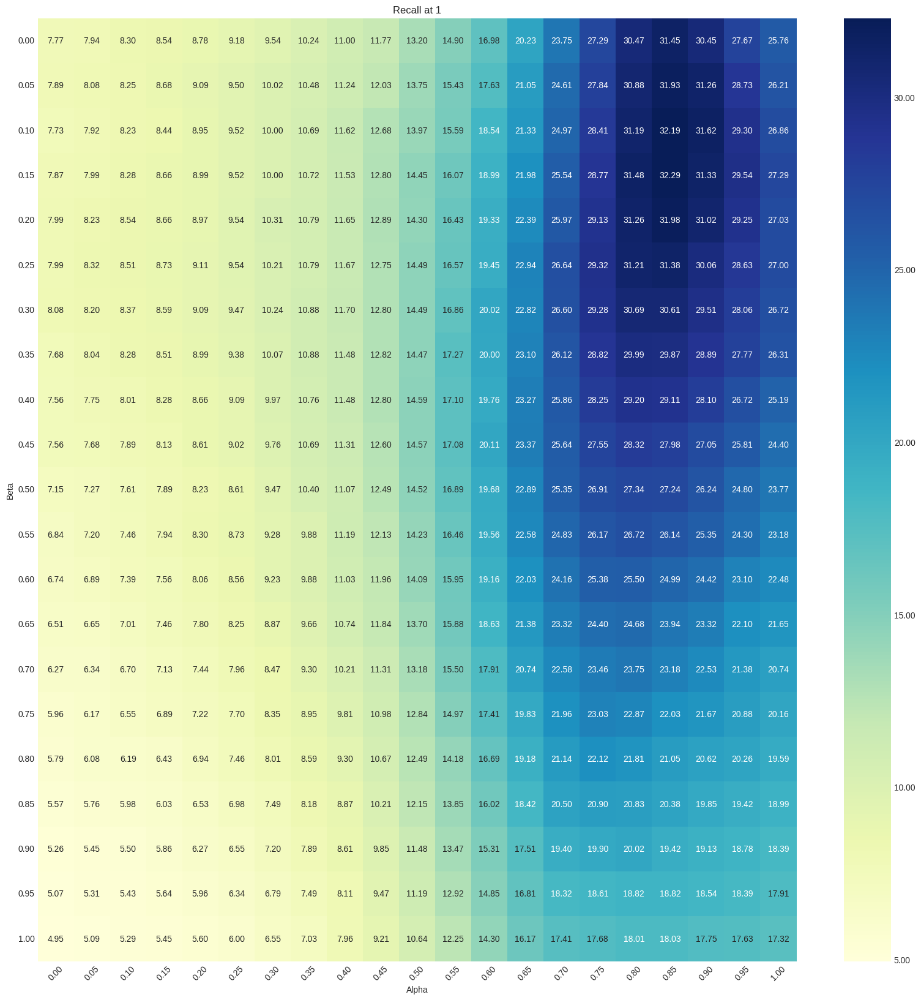

In [13]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

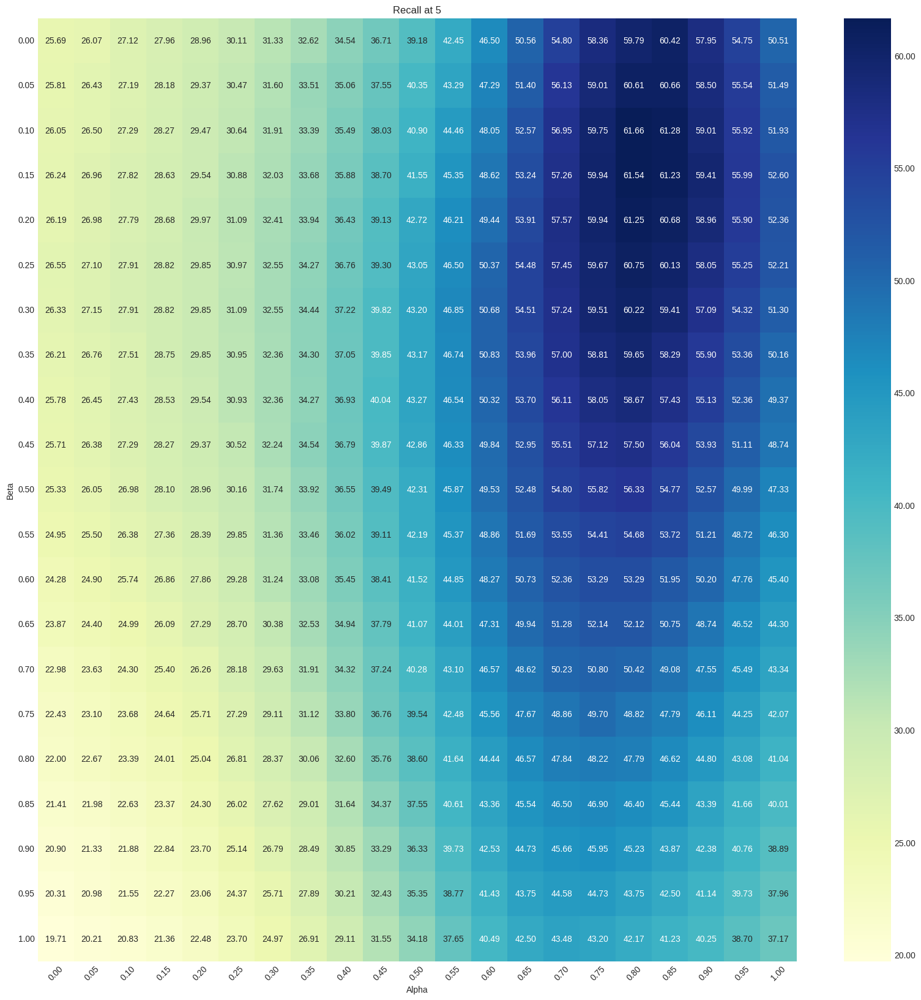

In [14]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

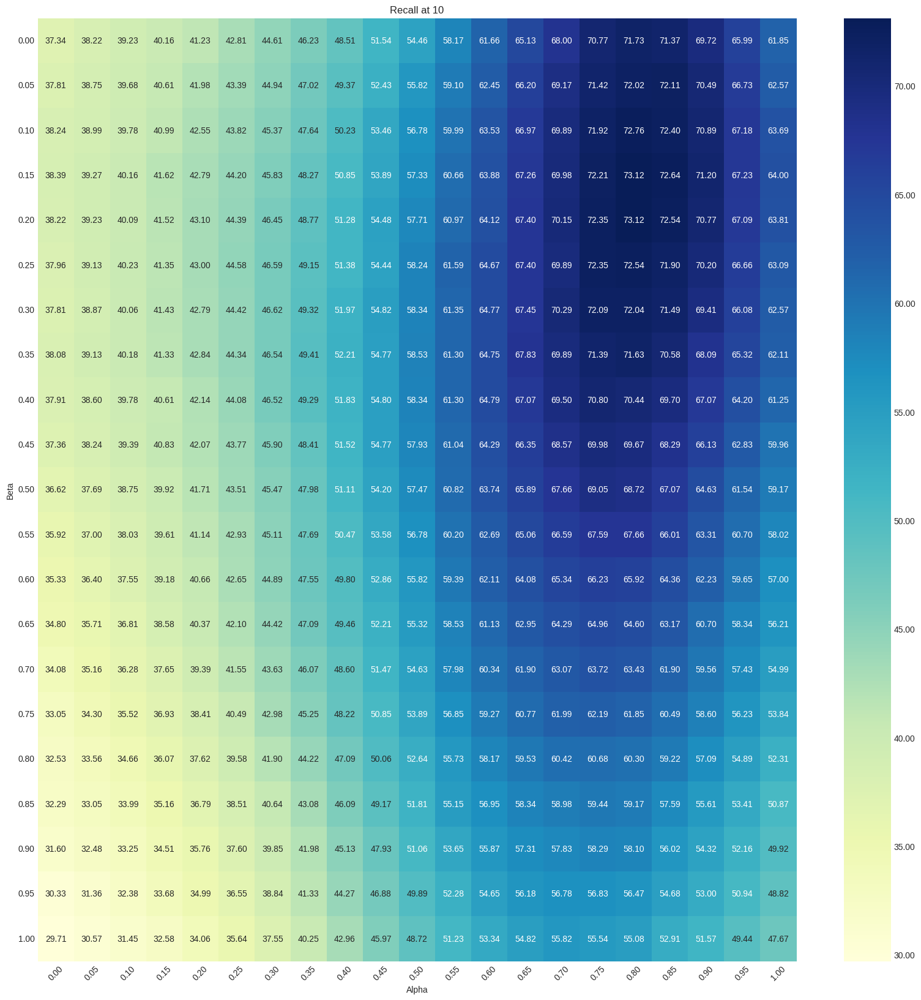

In [15]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

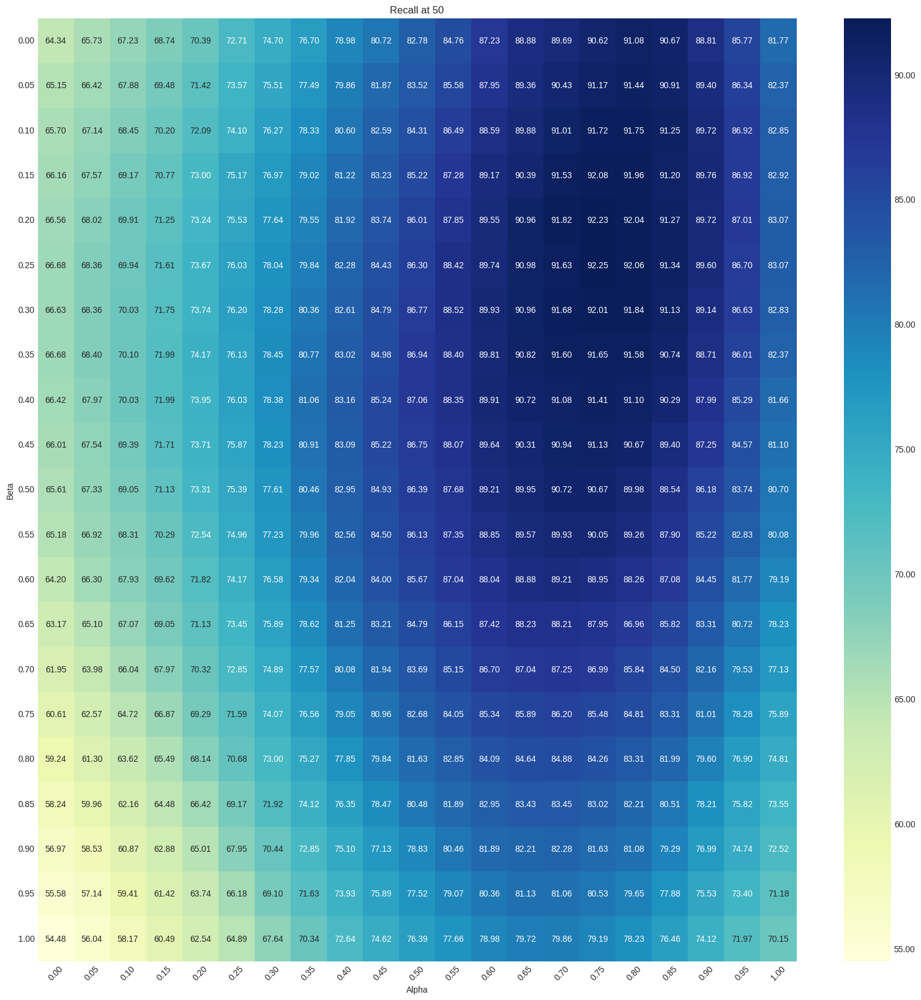

In [16]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

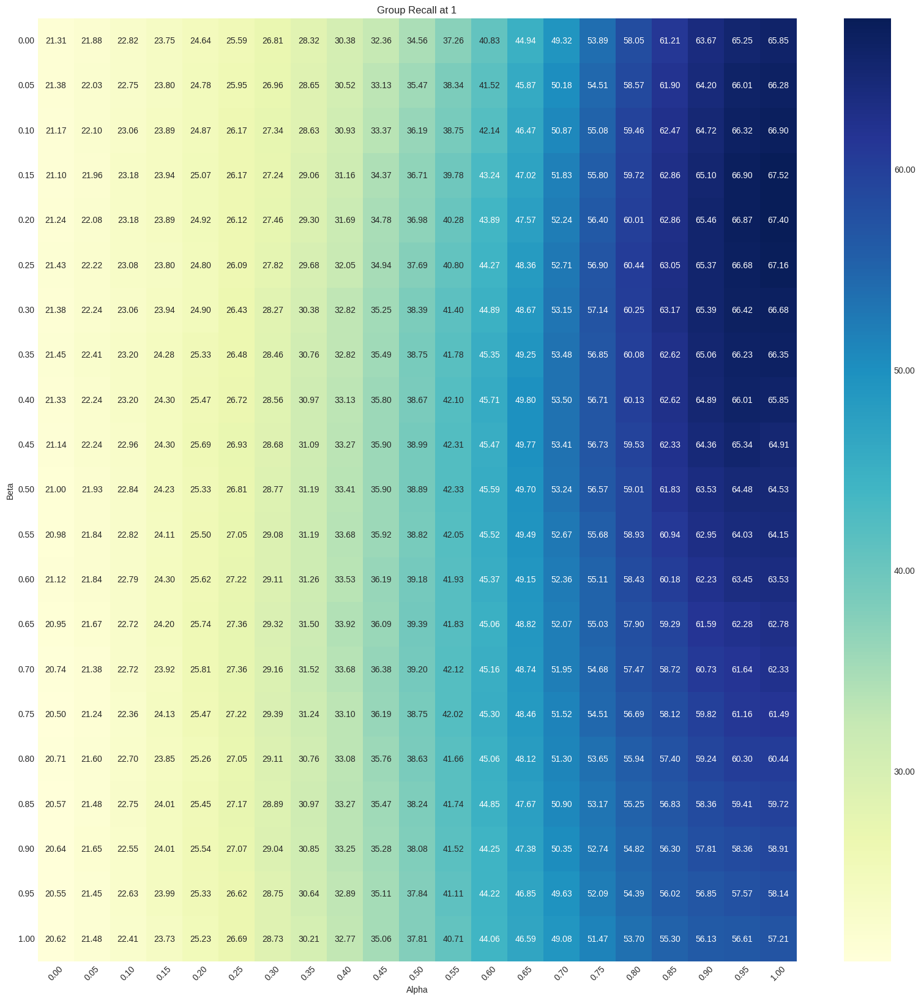

In [17]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

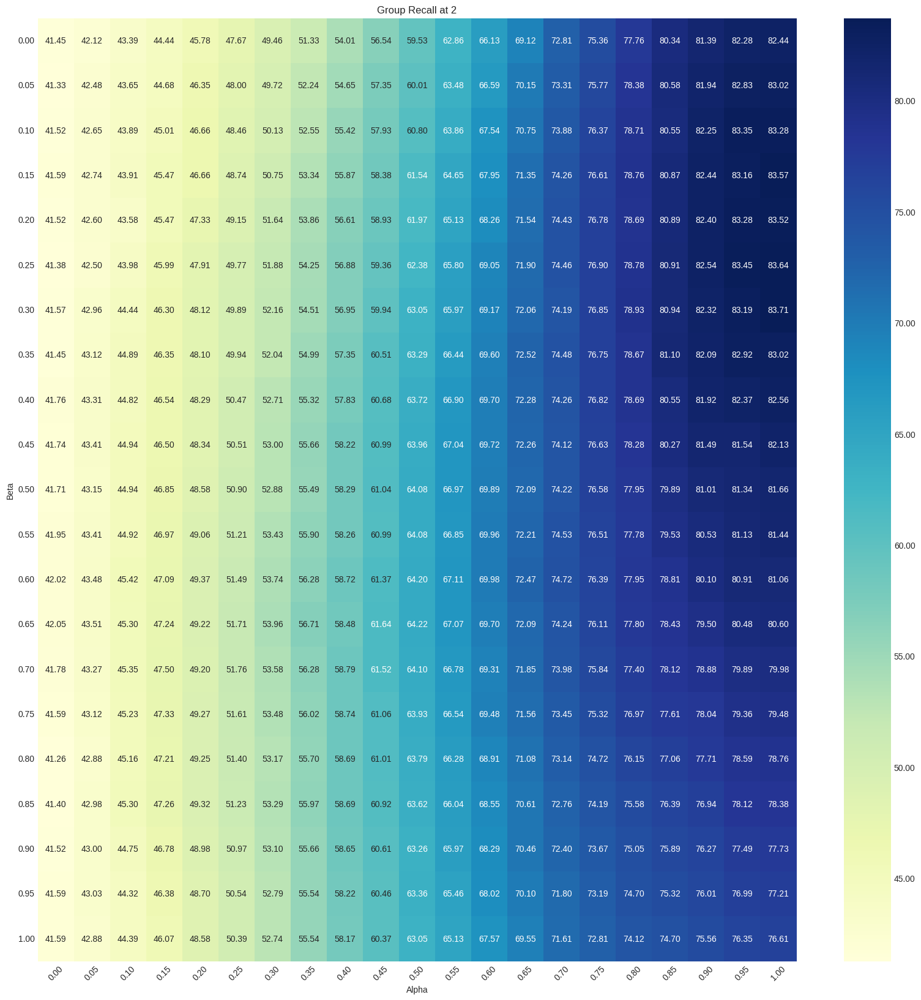

In [18]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

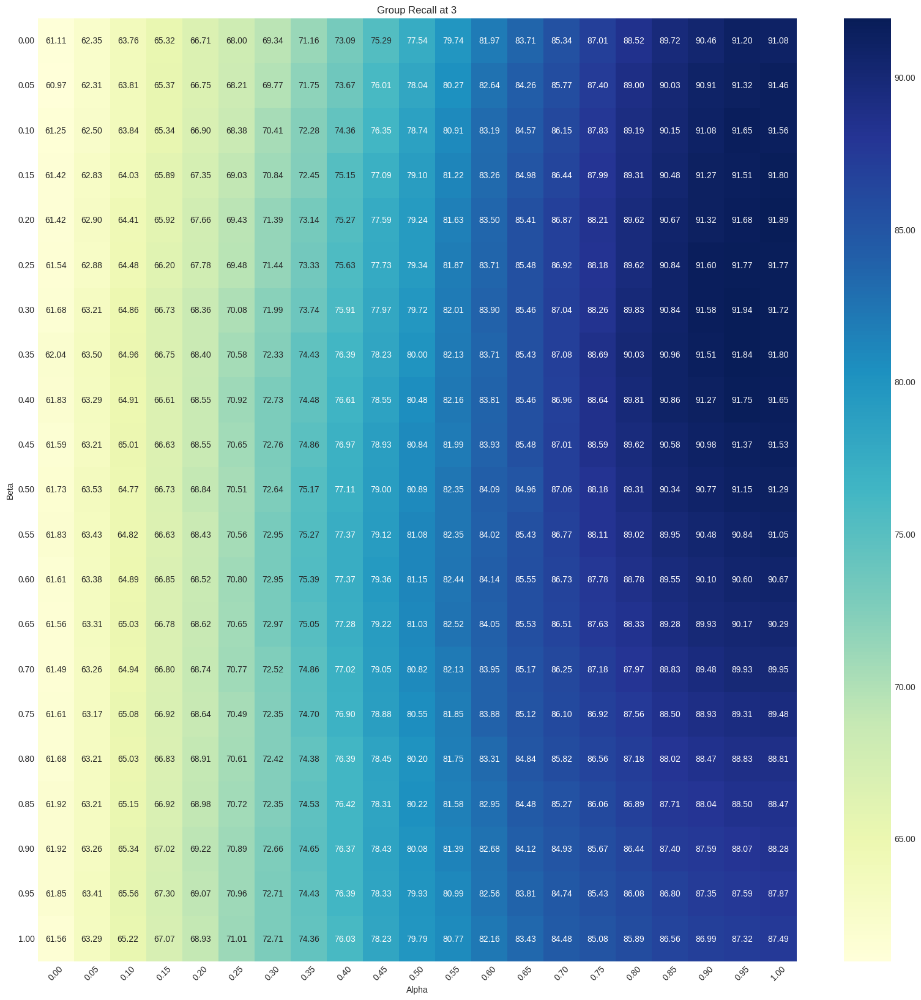

In [19]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [20]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val_clip(
    get_combing_function_with_alpha(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0.1,
    cache=cache,
)

Recall Results
Recall at 1: 31.19
Recall at 5: 61.66
Recall at 10: 72.76
Recall at 50: 91.75
Group Recall Results
Group Recall at 1: 59.46
Group Recall at 2: 78.71
Group Recall at 3: 89.19


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [21]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

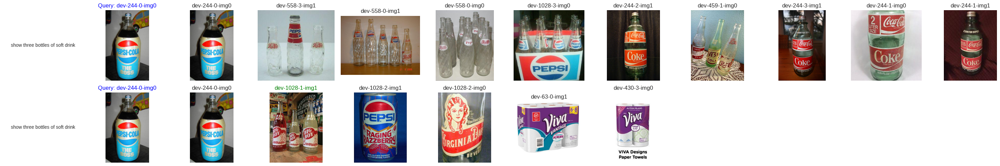

In [22]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [23]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val_clip(
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 13.20
Recall at 5: 39.18
Recall at 10: 54.46
Recall at 50: 82.78
Group Recall Results
Group Recall at 1: 34.56
Group Recall at 2: 59.53
Group Recall at 3: 77.54


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [24]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(891, [0, 19, 25, 34, 41, 50, 54, 60, 61, 68])

In [25]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(126, [16, 112, 195, 201, 288, 304, 327, 335, 474, 506])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

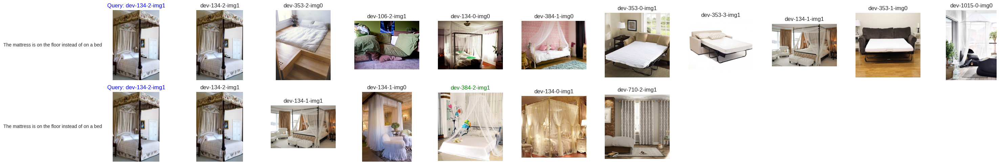

In [26]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=56)

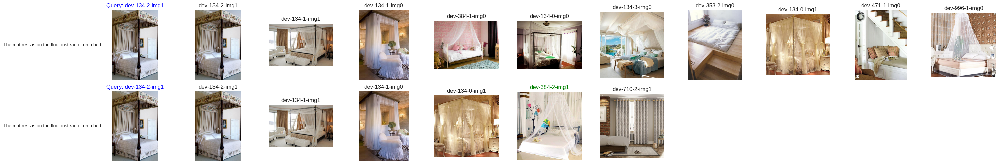

In [27]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=56)

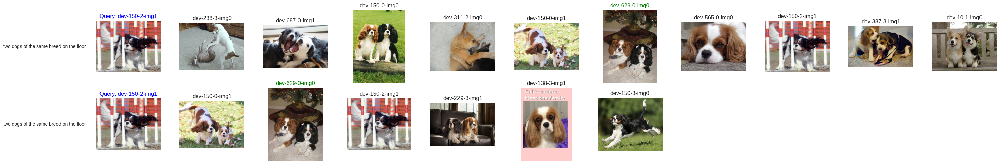

In [28]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

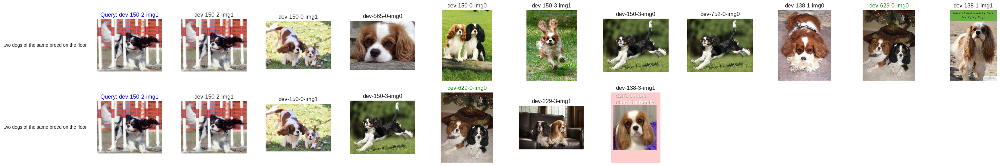

In [29]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

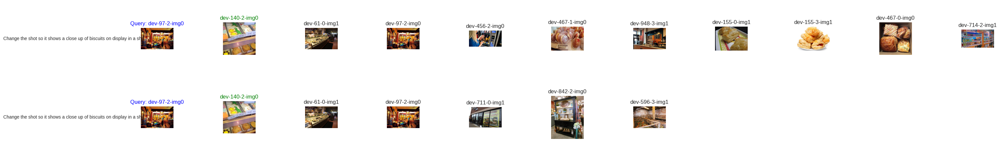

In [30]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=151)

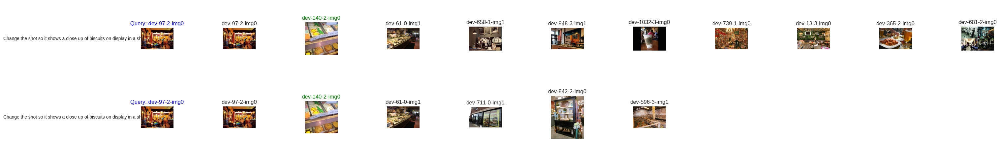

In [31]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=151)

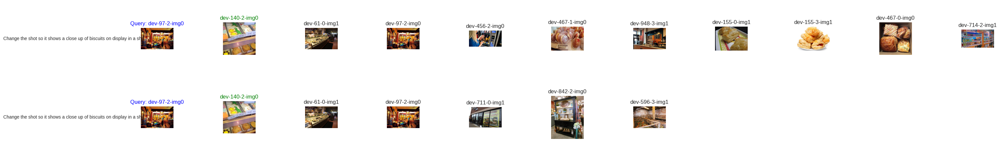

In [32]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=151)

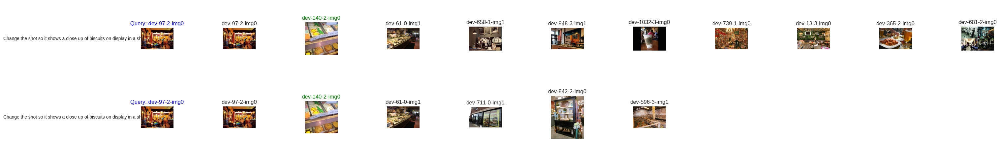

In [33]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=151)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 8: Save the results for plotting</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">This is used for better adjust visualization for report</div>

In [34]:
recall_at10.to_csv('recall_at10_clip_vit_g14_cirr.csv')
recall_at50.to_csv('recall_at50_clip_vit_g14_cirr.csv')